# Testing different ML models to predict gene set scores from surface protein data

In this notebook different reggressors (RandomForestRegressor, GradientBoostingReggressor, CatBoostRegressor) are tested to predict gene set scores from CLR tranformed surface protein data. 

5 common clusters were found in Melsen and Yang (+Crinier) datasets; 

1. Proliferating NK cells
2. CD56dim GZMK-
3. CD56dim GZMK+ (transitional subset between CD56bright and CD56dim NK cells)
4. CD56bright
5. lymhoid tissue-resident NK cells (lt-NK)

Here, gene set for CD56dim GZMK+ NK cells is explored. 


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import anndata as ad
import scvi
import scanpy as sc
import seaborn as sb


from sklearn.model_selection import train_test_split 
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score



Global seed set to 0
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [3]:
#markers

#Proliferating
prolif = ['S100A4', 'S100A6', 'KLRC2', 'IL32', 'GZMH', 'GNLY']

#CD56dim GZMK-
cd56dim_gzmk_neg= ['S100A4', 'S100A6', 'ACTB', 'ACTG1', 'CORO1A', 'PFN1', 'GZMB'] #lower expression of GZMB in gzmk_pos cluster, so marker added in this gene set

#CD56dim GZMK+
cd56dim_gzmk_pos = ['GZMK', 'SELL']

#CD56bright
cd56bright= ['NCAM1', 'KIT', 'SELL', 'CD2', 'IL7R', 'KLRC1']
#cd56bright_prot= ['CD56', 'CD62L', "CD2_prot", 'CD127']  #CD117 ab not used in this dataset

#lt-NK
lt_nk= ['CCL3', 'CCL4', 'XCL1', 'GZMK', 'CD160', 'DUSP2', 'CXCR4', 'BTG1']


In [4]:
#loading Neurips dataset
adata_neurips = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad')

In [5]:
adata_neurips

AnnData object with n_obs × n_vars = 80998 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [6]:
adata_neurips.obs['Site'].unique().tolist()

['site4', 'site3', 'site1', 'site2']

In [7]:
#selecting only sites 1 and 4 (good ab signals), from Neurips dataset

eg=adata_neurips[(adata_neurips.obs['Site'] == "site4") | (adata_neurips.obs['Site'] == "site1")].copy() 

In [8]:
eg.obs['Site'].unique().tolist()

['site4', 'site1']

In [9]:
#selecting only NK cells, gd T cells and ILCs using Neurips annotations

eg_nk = eg[(eg.obs['cell_type'] == "NK") | (eg.obs['cell_type'] == "NK CD158e1+")].copy()   


In [10]:
eg_nk.obs['cell_type'].unique().tolist()

['NK', 'NK CD158e1+']

In [11]:
#This includes now selected cells (NK, ILC, gd T) from site 1 and 4
eg_nk

AnnData object with n_obs × n_vars = 2640 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

## Calculating gene scores for gene sets

In [13]:
markers = cd56dim_gzmk_pos

In [14]:
markers

['GZMK', 'SELL']

In [15]:
#calculating scores for gene set

sc.tl.score_genes(eg_nk, markers, score_name = 'marker_score')

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


In [16]:
eg_nk.obs['marker_score']

GTAGTACCAATCCTTT-1-s4d1   -0.179350
CTGTGGGTCATGCGGC-1-s4d1   -0.265476
GCAACATTCGCAAGAG-1-s4d1   -0.198235
TCACGGGTCGCACGAC-1-s4d1   -0.340324
CGCCAGAAGACCATTC-1-s4d1   -0.215448
                             ...   
ATCATTCGTCCAATCA-1-s1d3   -0.326286
ACATTTCCAGCAGTGA-1-s1d3    0.389041
TGAGACTTCCTTCAGC-1-s1d3   -0.215462
GAGATGGTCCGCCTAT-1-s1d3   -0.428599
ACCTGTCTCACAGTGT-1-s1d3    1.374571
Name: marker_score, Length: 2640, dtype: float64

In [17]:
prot = eg_nk.obsm['protein_expression_clr_neurips']

In [18]:
#dropping columns containing only zeros

prot = prot.loc[:, (prot!=0).any(axis=0)]

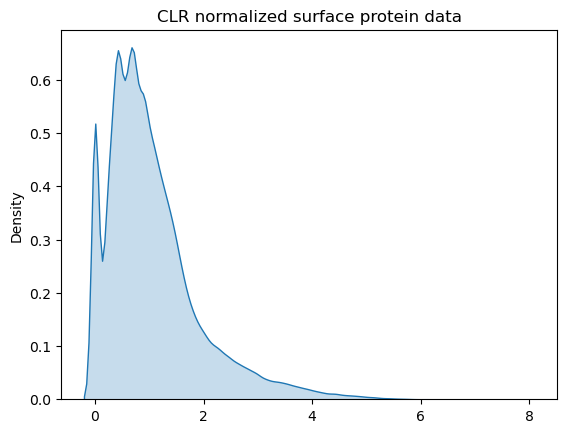

In [19]:
flatten_df = prot.to_numpy().flatten()

sb.kdeplot(flatten_df, fill = True) ; 


plt.title("CLR normalized surface protein data") ;

In [20]:
score_yang = eg_nk.obs['marker_score']

In [21]:
score_yang

GTAGTACCAATCCTTT-1-s4d1   -0.179350
CTGTGGGTCATGCGGC-1-s4d1   -0.265476
GCAACATTCGCAAGAG-1-s4d1   -0.198235
TCACGGGTCGCACGAC-1-s4d1   -0.340324
CGCCAGAAGACCATTC-1-s4d1   -0.215448
                             ...   
ATCATTCGTCCAATCA-1-s1d3   -0.326286
ACATTTCCAGCAGTGA-1-s1d3    0.389041
TGAGACTTCCTTCAGC-1-s1d3   -0.215462
GAGATGGTCCGCCTAT-1-s1d3   -0.428599
ACCTGTCTCACAGTGT-1-s1d3    1.374571
Name: marker_score, Length: 2640, dtype: float64

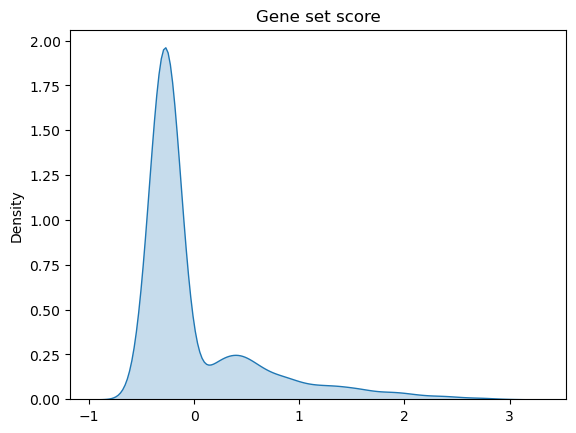

In [22]:
flatten_df1 = score_yang.to_numpy().flatten()

sb.kdeplot(flatten_df1, fill = True) ; 

plt.title("Gene set score") ;

In [23]:
#Creating df containign surface protein data + scores for gene sets

a = score_yang
b = prot

df =pd.concat([a, b], axis=1)


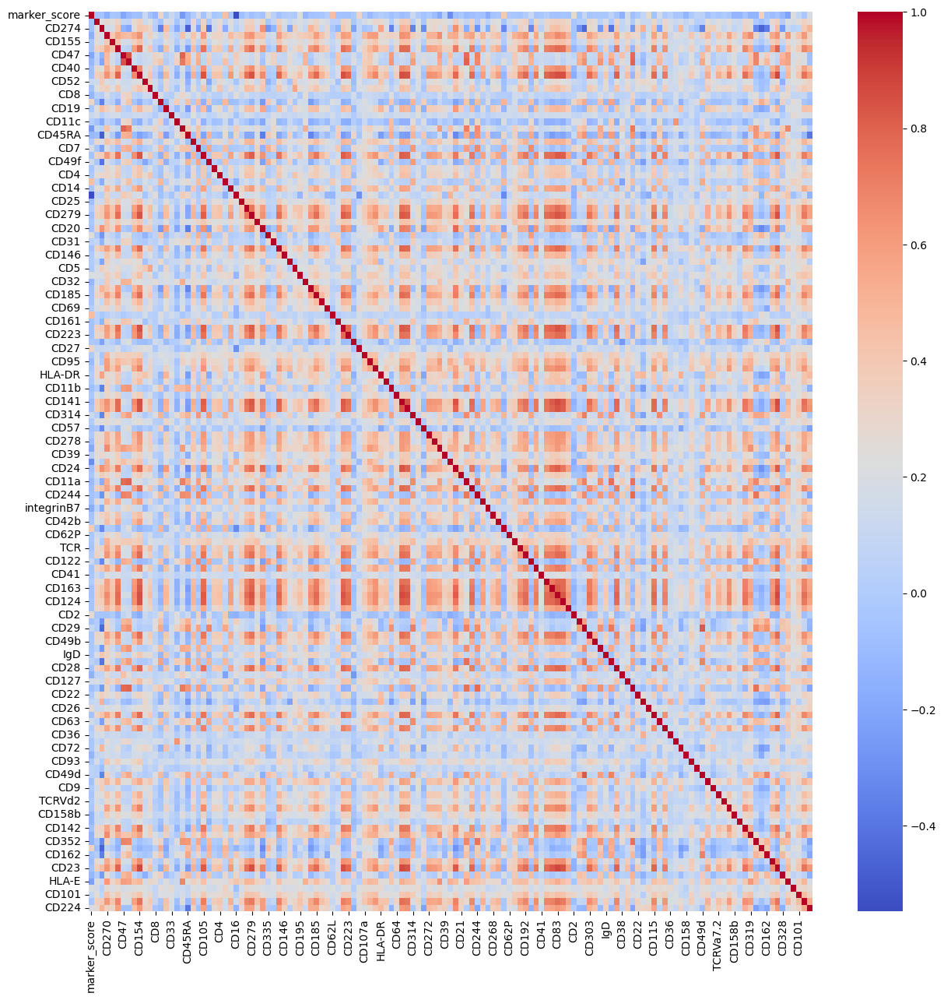

In [24]:
plt.figure(figsize=(15,15))
sb.heatmap(data=df.corr(),cmap='coolwarm')
plt.show()

## 1. RandomForestRegressor

In [32]:
#Random forest

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params = {#'bootstrap': [True, False],
 'max_depth': [3,5,7],
 #'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'],
 'min_samples_leaf': [2, 5, 10],
 #'min_samples_split': [2, 5, 10] ,
 #'n_estimators': [10, 50, 100]
}


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(RandomForestRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model = result.best_estimator_
y_pred = best_model.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)
    

Mean squared error: 0.12 R2 score: 0.61


In [33]:
#Mean training scores

print(mean_train_score)

[array([-0.13045481, -0.13055266, -0.13085356, -0.08782996, -0.09043908,
       -0.09887084, -0.06353924, -0.07068896, -0.08782569])]


In [34]:
# The best score and parameters

print(result.best_score_)
print(result.best_params_)

-0.13961529716387064
{'max_depth': 7, 'min_samples_leaf': 5}


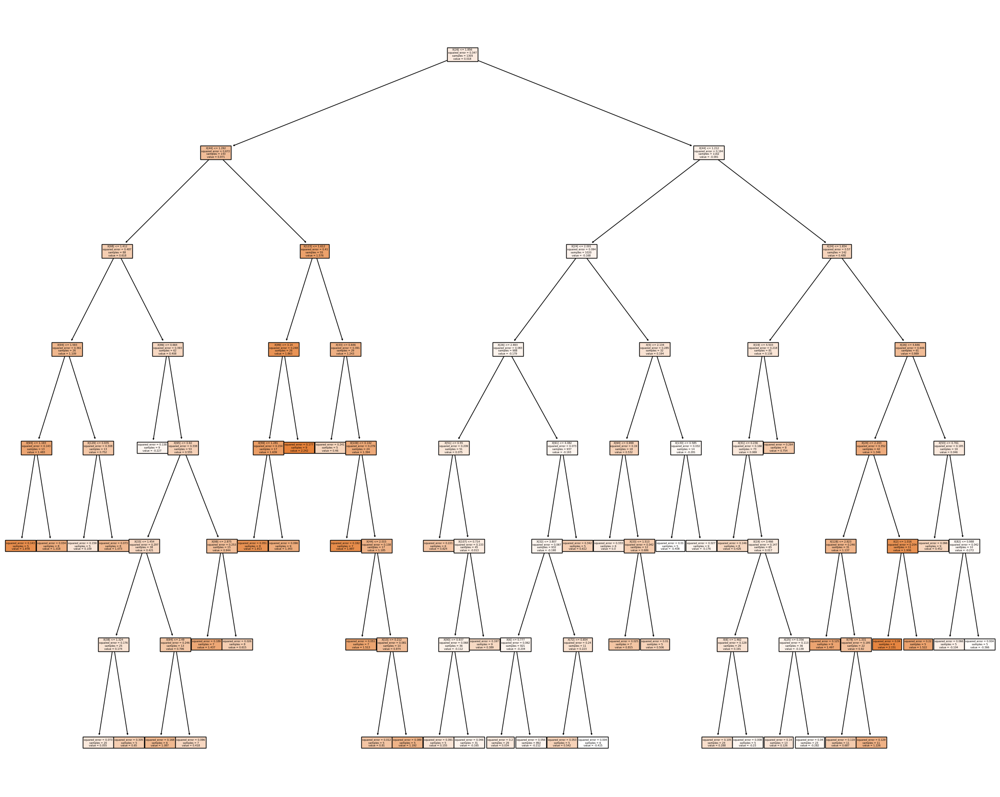

In [35]:
from sklearn import tree

plt.figure(figsize=(25, 20)) # Resize figure
tree.plot_tree(best_model.estimators_[0], filled = True) ;

plt.show()

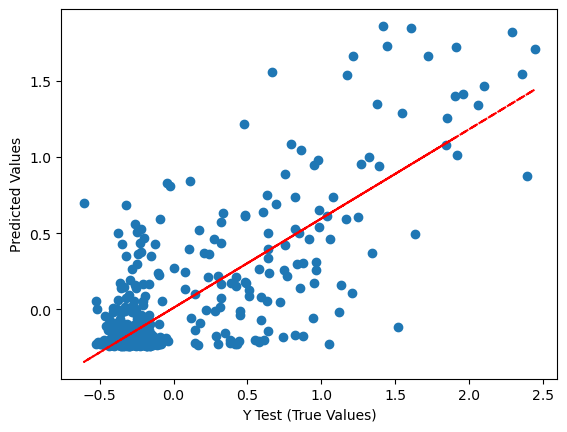

In [36]:
plt.scatter(y_test, y_pred)

# Add a trendline
z = np.polyfit(y_test, y_pred, 1)
p = np.poly1d(z)
plt.plot(y_test, p(y_test), 'r--')
# Add labels
plt.xlabel('Y Test (True Values)')
plt.ylabel('Predicted Values')
plt.show()

<AxesSubplot: xlabel='marker_score', ylabel='Density'>

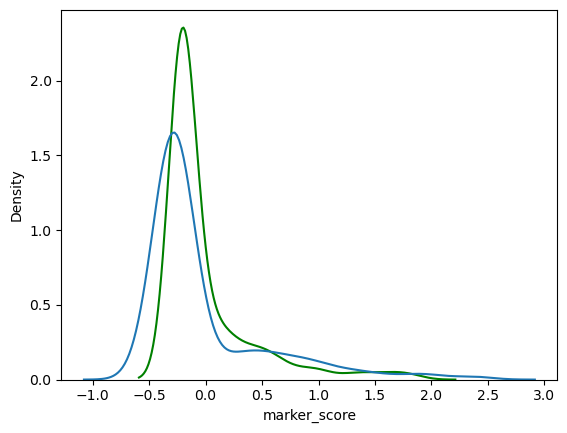

In [37]:
sb.kdeplot(y_pred, color = "g") #predicted values
sb.kdeplot(y_test) #observed values

In [38]:
#Feature importances

importances_rf = best_model.feature_importances_
importances_rf = pd.Series(importances_rf, index=prot.columns)
importances_rf=importances_rf.sort_values(ascending=False)

print(importances_rf.head(10))

CD16     0.425047
CD62L    0.173280
CD44     0.093341
CD56     0.016483
CD54     0.016433
CD27     0.011755
CD94     0.011741
CD81     0.011307
CD38     0.009985
CD2      0.008843
dtype: float64


In [39]:
#df from the top 20 important markers
importances_rf=pd.DataFrame(importances_rf)
importances_rf_top=importances_rf[0:20]
importances_rf_top=importances_rf_top.T

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


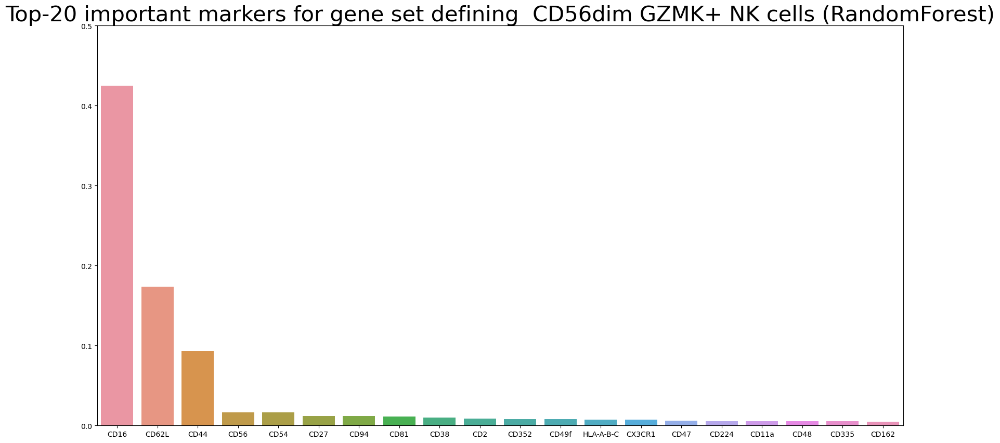

In [56]:
plt.figure(figsize=(20,10))
plt.ylim(0,0.5)
a=sb.barplot(data=importances_rf_top)

plt.title("Top-20 important markers for gene set defining  CD56dim GZMK+ NK cells (RandomForest)", fontsize = 30) ;


## 2. Dummy Reggressor

In [25]:
from sklearn.dummy import DummyRegressor

X = df.iloc[:, 1:]
y = df['marker_score']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=0)

lm_dummy_mean = DummyRegressor(strategy = 'mean').fit(X_train, y_train)
  
lm_dummy_median = DummyRegressor(strategy = 'median').fit(X_train, y_train)

y_predict_dummy_mean = lm_dummy_mean.predict(X_test)
y_predict_dummy_median = lm_dummy_median.predict(X_test)

In [26]:
print("Mean squared error (dummy): {:.2f}".format(mean_squared_error(y_test, 
                                                                     y_predict_dummy_mean)))
  
print("r2_score (dummy mean): {:.2f}".format(r2_score(y_test, y_predict_dummy_mean)))
print("r2_score (dummy median): {:.2f}".format(r2_score(y_test, y_predict_dummy_median)))

Mean squared error (dummy): 0.30
r2_score (dummy mean): -0.00
r2_score (dummy median): -0.15


## 3. GragientBoostingRegressor

In [43]:
#Gradient boosting regressor

from sklearn.ensemble import GradientBoostingRegressor

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params =  {'max_depth': [3,5,7],
          'min_samples_leaf': [2, 5, 10]}


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(GradientBoostingRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model_gbr = result.best_estimator_
y_pred = best_model_gbr.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)

Mean squared error: 0.11 R2 score: 0.63


In [44]:
print(mean_train_score)

[array([-0.06296863, -0.06377088, -0.06567454, -0.01657322, -0.01755036,
       -0.02280478, -0.00196612, -0.00281305, -0.00667294])]


<AxesSubplot: xlabel='marker_score', ylabel='Density'>

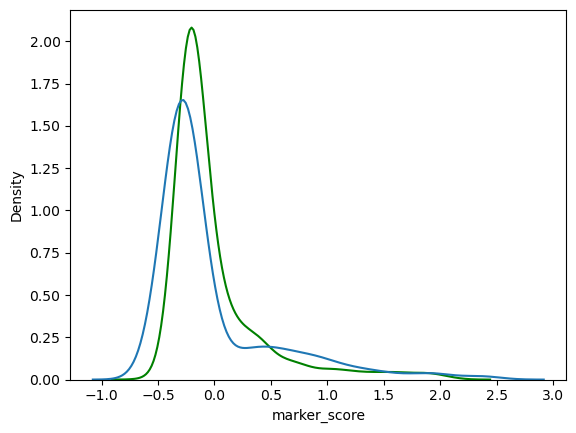

In [45]:
sb.kdeplot(y_pred, color = "g")
sb.kdeplot(y_test)

In [46]:
importances_gbr = best_model_gbr.feature_importances_
importances_gbr = pd.Series(importances_gbr, index=prot.columns)
importances_gbr=importances_gbr.sort_values(ascending=False)

print(importances_gbr.head(10))

CD16         0.424623
CD62L        0.156956
CD44         0.119068
CD56         0.032254
CD81         0.019115
HLA-A-B-C    0.015046
CD94         0.013587
CD48         0.012952
CD2          0.012633
CD27         0.012473
dtype: float64


In [47]:
#df from the top 20 important markers
importances_gbr=pd.DataFrame(importances_gbr)
importances_gbr_top=importances_gbr[0:20]
importances_gbr_top=importances_gbr_top.T

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


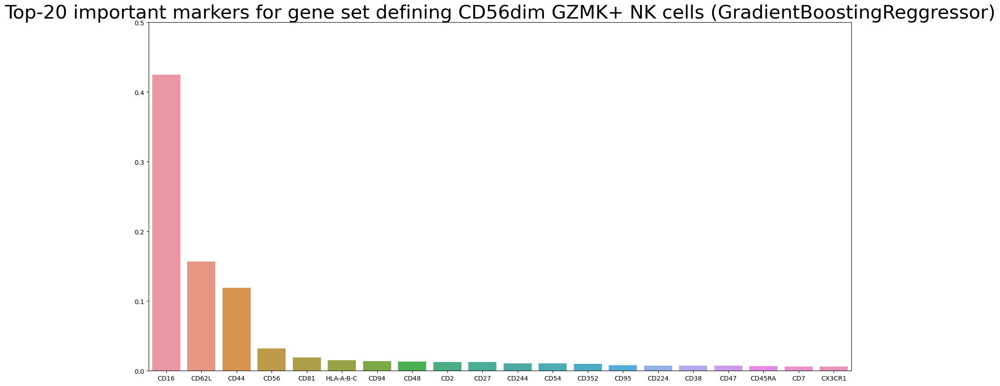

In [57]:
plt.figure(figsize=(20,10))
plt.ylim(0,0.5)
a=sb.barplot(data=importances_gbr_top)

plt.title("Top-20 important markers for gene set defining CD56dim GZMK+ NK cells (GradientBoostingReggressor)", fontsize = 30) ;



## 4. CatBoostRegressor

In [27]:
from catboost import CatBoostRegressor

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params= {'depth': [6,8,10],
        'learning_rate' : [0.01, 0.05, 0.1],
        'iterations'    : [30, 50, 100]
                 }

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(CatBoostRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train, verbose = 0)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model_cb = result.best_estimator_
y_pred = best_model_cb.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)

Mean squared error: 0.12 R2 score: 0.61


<AxesSubplot: xlabel='marker_score', ylabel='Density'>

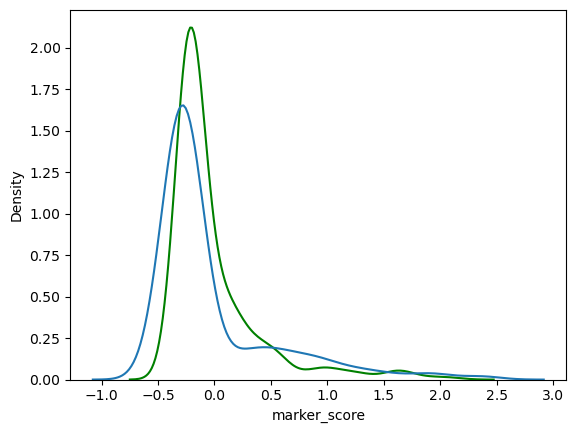

In [28]:
sb.kdeplot(y_pred, color = "g")
sb.kdeplot(y_test)

In [34]:
importances_cb = best_model_cb.feature_importances_
importances_cb = pd.Series(importances_cb, index=prot.columns)
importances_cb=importances_cb.sort_values(ascending=False)

print(importances_cb.head(10))

CD16         24.549087
CD62L        18.499746
CD44         12.643798
HLA-A-B-C     2.831006
CD56          2.362346
CD94          2.335548
CD54          1.987221
CD352         1.671129
CX3CR1        1.659967
CD224         1.481380
dtype: float64


In [35]:
#df from the top 20 important markers
importances_cb=pd.DataFrame(importances_cb)
importances_cb_top=importances_cb[0:20]
importances_cb_top=importances_cb_top.T

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


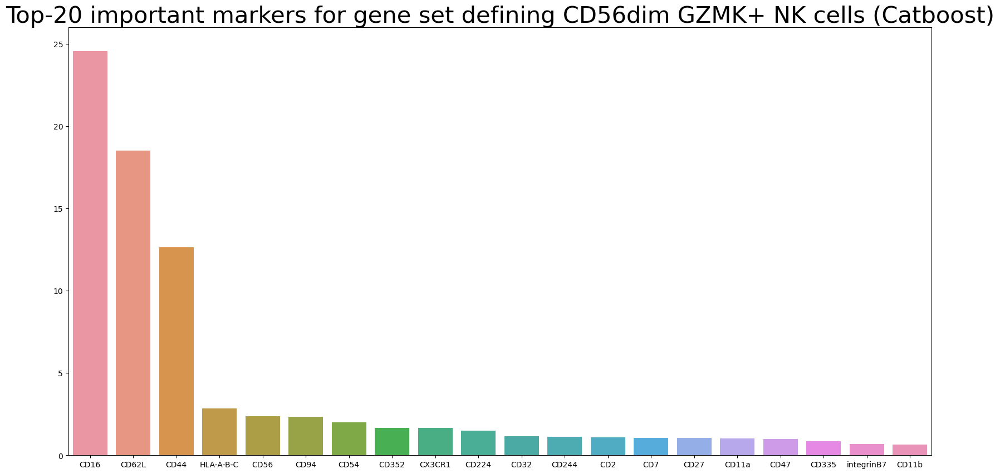

In [36]:
plt.figure(figsize=(20,10))
plt.ylim(0,26)
a=sb.barplot(data=importances_cb_top)

plt.title("Top-20 important markers for gene set defining CD56dim GZMK+ NK cells (Catboost)", fontsize = 30) ;




## 5. UMAP visualization

In [40]:
markers_prot = ['CD16', 'CD62L', 'CD44_prot', 'HLA-A-B-C', 'CD56', 'CD94', 'CD54', 'CD352', 'CX3CR1', 'CD224_prot']


In [41]:
#Computing a neighborhood of observations using latent space

sc.pp.neighbors(adata_neurips, use_rep="X_totalVI")   

sc.tl.umap(adata_neurips)

In [42]:
#selecting one sample from Neurips

sample =adata_neurips[adata_neurips.obs['POOL'] == "s4d1"].copy()

In [43]:
#saving protein information

prot=sample.obsm['protein_expression_clr_neurips']

In [44]:
#Some genes have same names, so _prot added after some proteins

prot=prot.rename(columns={'CD2': 'CD2_prot', 'CD83': 'CD83_prot', 'HLA-E': 'HLA-E_prot', 'CX3CR1': 'CX3CR1_prot', 'CD52': 'CD52_prot','CD69': 'CD69_prot', 'CD226':'CD226_prot', 'CD47': 'CD47_prot', 'TIGIT':'TIGIT_prot', 'CD27':'CD27_prot', 'CD38': 'CD38_prot', 'CD224': 'CD224_prot', 'CD7': 'CD7_prot', 'CD44': 'CD44_prot', 'CD34': 'CD34_prot','CD5': 'CD5_prot'})

In [45]:
#adding protein information to obs

a = sample.obs
b = prot

adata_sample=pd.concat([a, b], axis=1)
sample.obs=adata_sample

sample

AnnData object with n_obs × n_vars = 4885 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47_prot', 'CD48', 'CD40', 'CD154', 'CD52_prot', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD16

In [46]:
sample

AnnData object with n_obs × n_vars = 4885 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47_prot', 'CD48', 'CD40', 'CD154', 'CD52_prot', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD16

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


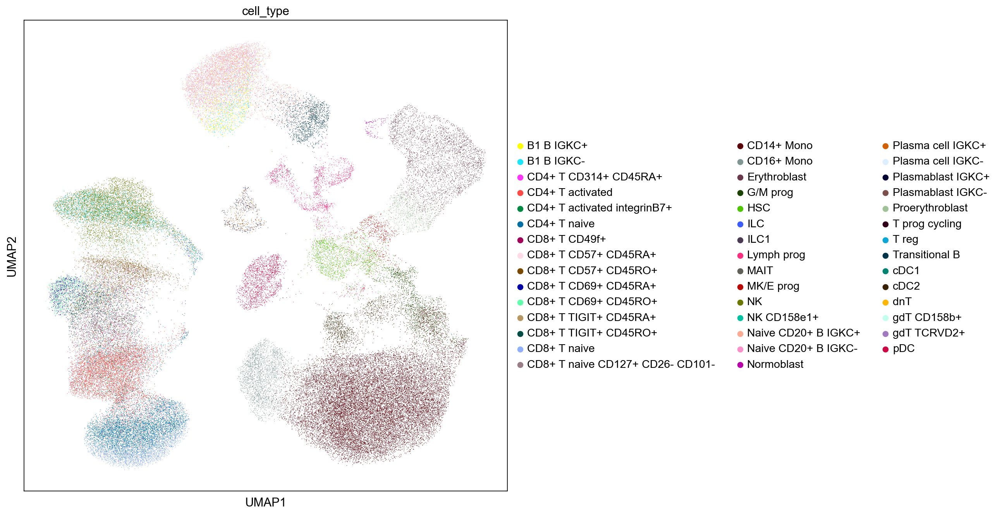

In [47]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips, color = ['cell_type'])

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


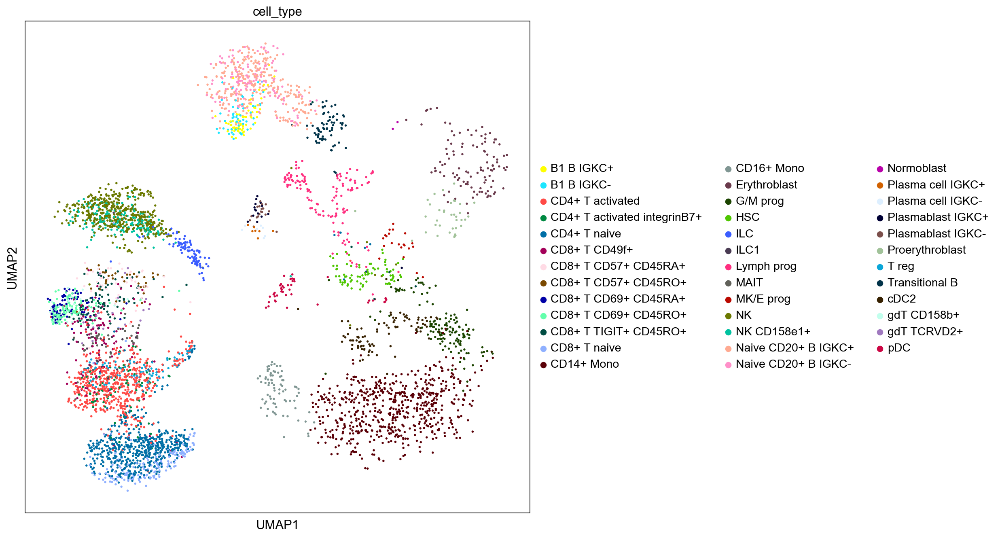

In [48]:
#only one sample

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(sample, color = ['cell_type'])

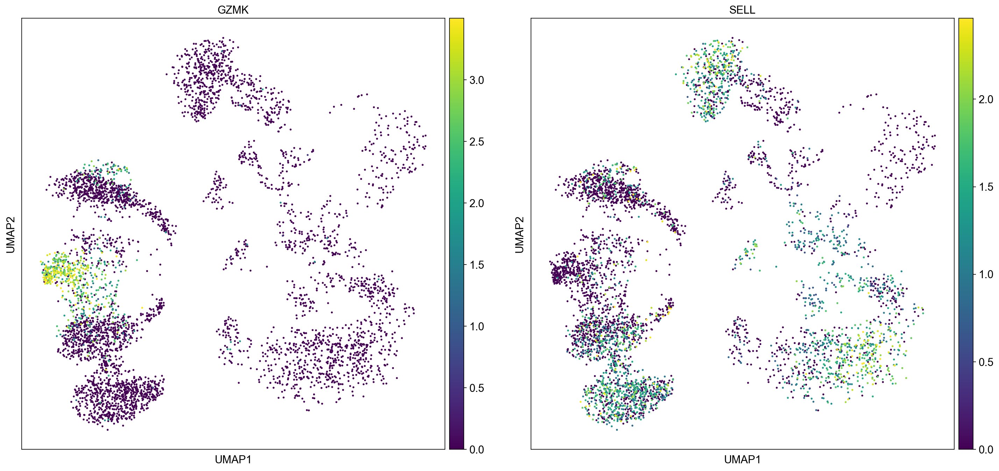

In [49]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(sample, color = markers,  vmax="p99", ncols = 2)

UMAPs above represent RNA markers for CD56dim GZMK+ NK cells (according to Melsen et al., paper). 

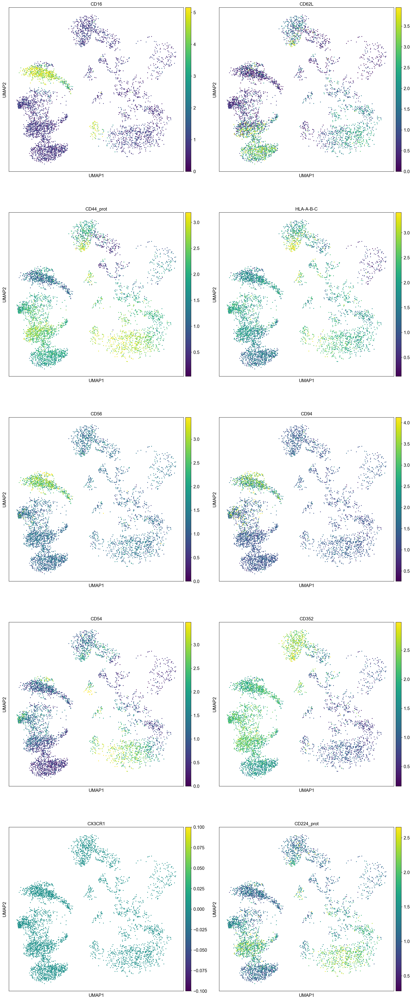

In [50]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(sample, color = markers_prot,  vmax="p99", ncols = 2)

Markers above are important features (surface proteins) identified by CatBoostReggressor. 